# Company_Name
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>

## Задачи  
1. Представь, что ты главный аналитик в компании и собираешь дашборд с ключевыми метриками (от 4 до 6) для СЕО, на основании которых он будет судить о "здоровье" бизнеса, эффективности текущих операций и т.д. каждый день.
 Исходя из специфики индустрии и бизнес-модели, какие метрики ты бы отразил? Коротко можно объяснить почему.


2. Основная задача аналитиков в нашей компании - растить бизнес. Иногда мы сами не знаем где прячутся эти точки кратного роста, поэтому порой приходится кранчить данные и искать зависимости/аномалии, генерировать гипотезы в процессе и потом предлагать проекты. Мы дадим доступ к базе со срезом транзакций. Твое задание: найти все интересные на твой взгляд инсайты и представь их в любом удобном виде (ноутбук желательно приложить).  


## Результаты работы
<b>Первая задача - Ключевые метрики</b>
<ol><li> Активные пользователи. Сервис постоянно привлекает новых пользователей, однако большая часть уходит спутся месяц. Важно показать какое количество клиентов пользуется услугами регулярно, для кого онлайн покупка продуктов стала уже привычкой. Из предложения, которое всплывает при установке приложения, ясно, что активными считаются пользователи, совершающие покупку раз в 15 дней. Эту метрику стоит показывать первой.</li>
    <li>DAU и количество новых пользователей позволит отразить динамику новых привлечений.</li>
    <li>Доля новых пользователей, добавивших товар в корзину, но не завршивших оформление заказа. Эта метрика показывает какая часть пользователей уходит из-за несовершенств сервиса.</li>
    <li>Количество нарушений сроков доставки и загруженность службы доставки. Ключевая метрика пользовательского опыта и способности сервиса к росту. Нарушение сроков доставки - дополнительный стимул для пользователя отдать предпочтение розничному магазину. </li>
    <li>Средний чек - показатель не только отражающий уровень дохода с заказа, но и способность сервиса генерировать дополнительные продажи. При росте количества активных пользователей и соблюдения сроков доставки, динамика среднего чека служит индикатором способности сервиса предлагать дополнительные товары.</li>
    <li>Количество запросов к отсутствующим товарам. Одна из самых частых жалоб в App Store это недостаточный ассотримент в сравнении с розничными магазинами.</li></ol>



<b>Вторая задача - Аномалии в данных</b>
<ol><li>Увеличение медианного заказа в первом полугодии 2019 затронуло как новых, так и постоянных пользователей.</li>  
    <li>Рост доли заказов с использованием промо кодов. Сервис активно предоставляет скидки на стоимость доставки и сумму заказа. Это эффективный инструмент привлечения новых клиентов, повышения лояльности и способ оценить чувствительность пользователей к цене.</li>
    <li>Отток пользователей в конце 2018 - начале 2019 привел к снижению уровня заказов, выручки и числа активных клиентов.</li>
    <li>Особенности поведения пользователей в зависимости от времени суток и дня недели. Эти параметры оказывают сильное влияние на сумму заказа и количество покупок. Построение промо предложений с учетом этих показателей позволит обеспечить рост продаж и сбалансировать нагрузку на службу доставки.</li>
    <li>Нарушение сроков доставки отдельными ретейлерами</li>
    <li>Различия в количестве заказов и нарушений сроков доставки в зависимости от района Москвы.</li></ol>
    
(!!) Отмена позиций из уже сформированного заказа негативно влияет на пользовательский опыт.  <br>
В таких случаях на первый план выходит способность сотрудников предложить достойную альтернативу. <br>
Среди розничных магазинов есть те, в которых доля замен выше доли отмененных позиций.  <br>
Анализ причин успеха этих магазинов и выявление лучших практик позволит снизить долю отмененных товаров в корзине.

## Импорт библиотек и загрузка данных
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>

In [535]:
act = orders[orders['month_year_x'] == '2019-07'].user_id.value_counts().reset_index()
act = act[act['user_id'] > 2]
len(act)
orders[orders['month_year_x'] == '2019-07'].user_id.nunique()

25198

In [445]:
import pandas as pd
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import seaborn as sns
import json
from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, MultiPolygon, Feature
import plotly.express as px

In [187]:
# Создаем настройки подключения

db_config = {'user': 'XXX', 
             'pwd': 'XXX', 
             'host': 'XXX',
             'port': 6432, 
             'db': 'XXX} 

connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(db_config['user'],
                                                         db_config['pwd'],
                                                         db_config['host'],
                                                         db_config['port'],
                                                         db_config['db'])

engine = create_engine(connection_string, connect_args={'sslmode':'require'})

In [218]:
query = '''
        SELECT * FROM orders
        '''


In [219]:
orders = pd.io.sql.read_sql(query, con = engine)

In [220]:
orders.head()

,id,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,created_at,ship_address_id,store_id,delivery_window_id
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,2018-01-05 00:07:04,448086,2,75258.0
1,3182881,73307,190.0,190.0,6076,0.0,30275,52,shipped,2018-01-06 15:33:54,2018-01-05 02:04:42,450946,10,75860.0
2,3146329,75386,290.0,290.0,2617,0.0,93040,24,shipped,2018-01-11 06:40:38,2018-01-05 02:07:35,458911,14,78635.0
3,3150465,45970,290.0,290.0,3422,0.0,10518,23,shipped,2018-01-06 12:55:22,2018-01-05 02:15:15,448101,21,75403.0
4,3169087,49089,90.0,90.0,3666,0.0,22740,31,shipped,2018-01-06 16:17:27,2018-01-05 02:48:52,451302,3,75825.0


In [221]:
# Проверяем на дубликаты. Они есть, но их доля в общем количестве заказов низка

dups = orders['id'].value_counts()
dups[dups > 1]

3557523    3
3535889    3
4920170    3
3452460    3
4238842    2
          ..
5141525    2
3390916    2
3661516    2
4172477    2
4879214    2
Name: id, Length: 577, dtype: int64

In [222]:
# Добавим столбец с месяцем и годом создания заказа. Он будет использоваться для групптировки

orders['month_year'] = pd.to_datetime(orders['created_at']).dt.to_period('M')

In [223]:
len(orders)

334245

In [224]:
# Выгрузим отмены

query = '''
        SELECT * FROM cancellations
'''

In [225]:
cancellations = pd.io.sql.read_sql(query, con = engine)
cancellations.head()

,order_id,item_id,state
0,3182881,5331852,canceled
1,3182881,5351271,canceled
2,3182881,5351087,canceled
3,3182881,5351090,canceled
4,3146329,5356620,canceled


In [226]:
# Выгрузим замены

query = '''
        SELECT * FROM replacements
'''

In [227]:
replacements = pd.io.sql.read_sql(query, con = engine)
replacements.head()

,order_id,item_id,state
0,3190332,5332717,replaced
1,3190332,5332761,replaced
2,3097213,5332862,replaced
3,3097213,5332917,replaced
4,3188867,5440591,replaced


In [228]:
# Формируем список заказов с отмененными позициями и добавляем флаг отмены/замены в основной датасет

canc_ord = cancellations['order_id'].unique()
repl_ord = replacements['order_id'].unique()
orders['canc'] = orders.id.map(lambda x: 1 if x in canc_ord else 0)
orders['repl'] = orders.id.map(lambda x: 1 if x in repl_ord else 0)
orders.head(1)

,id,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,created_at,ship_address_id,store_id,delivery_window_id,month_year,canc,repl
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,2018-01-05 00:07:04,448086,2,75258.0,2018-01,0,0


In [229]:
# Добавим день недели и дату заказа и доставки

orders['order_weekday'] = orders['created_at'].dt.weekday
orders['order_date'] = orders['created_at'].dt.date
orders.head(1)

,id,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,created_at,ship_address_id,store_id,delivery_window_id,month_year,canc,repl,order_weekday,order_date
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,2018-01-05 00:07:04,448086,2,75258.0,2018-01,0,0,4,2018-01-05


In [95]:
# Загружаем магазины

query = '''
        SELECT * FROM stores
        '''

In [96]:
stores = pd.io.sql.read_sql(query, con = engine)

In [230]:
orders = orders.merge(stores, how = 'left', left_on = 'store_id', right_on = 'id')

In [204]:
len(orders)

334245

In [99]:
# Подпишем окна доставки

query = '''
        SELECT * FROM delivery_windows        
'''

In [100]:
delivery = pd.io.sql.read_sql(query, con = engine)

In [231]:
delivery.drop_duplicates(subset = 'id', inplace = True)

In [232]:
orders = orders.merge(delivery, how = 'left', left_on = 'delivery_window_id', right_on = 'id', suffixes = ['_x', '_z'])
orders.head(1)

,id_x,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,...,order_weekday,order_date,id_y,city,retailer_id,store_id_z,id,starts_at,ends_at,time_zone
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,...,4,2018-01-05,2.0,1.0,1.0,2.0,75258.0,2018-01-05 08:00:00,2018-01-05 10:00:00,Europe/Moscow


In [234]:
# Флаги промо заказов

orders['promo_cost'] = orders['promo_total'].apply(lambda x: 0 if x == 0 else 1)
orders['promo_del'] = orders.apply(lambda x: 0 if x.cost == x.total_cost else 1, axis = 1)
orders['promo'] = orders.apply(lambda x: 1 if x.promo_cost + x.promo_del > 0 else 0, axis = 1)

In [235]:
# Добавляем дату и время доставки и заказа 

orders['ship_weekday'] = orders['starts_at'].dt.weekday
orders['ship_date'] = orders['starts_at'].dt.date
orders['order_hour'] = orders['created_at'].dt.hour
orders['del_hour'] = orders['starts_at'].dt.hour
orders.head(1)

,id_x,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,...,starts_at,ends_at,time_zone,promo_cost,promo_del,promo,ship_weekday,ship_date,order_hour,del_hour
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,...,2018-01-05 08:00:00,2018-01-05 10:00:00,Europe/Moscow,0,0,0,4.0,2018-01-05,0,8.0


## EDA
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

### Динамика заказов, выручки и среднего чека  

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>

In [236]:
# В таблице с заказами последний месяц не полный, отрежем его для корректного отображения на графиках

orders = orders[orders.month_year < '2019-08']

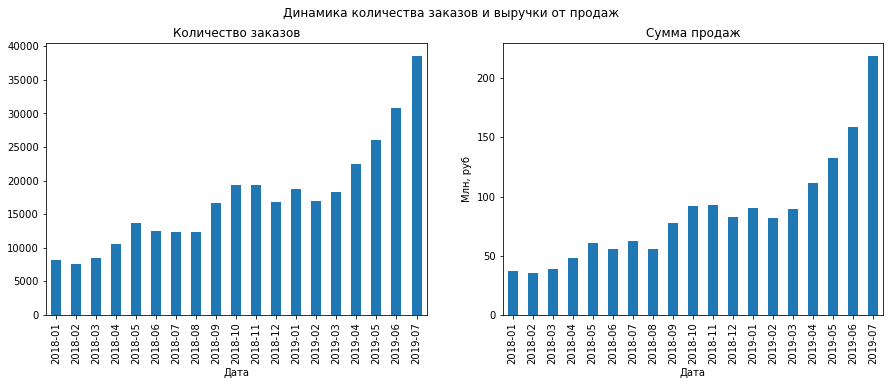

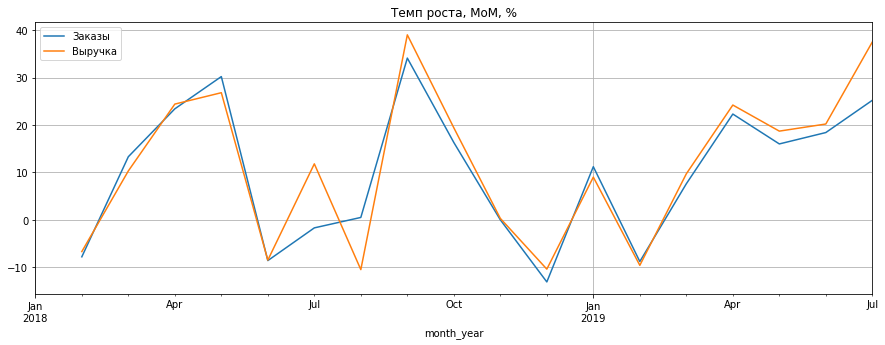

In [237]:
pd.options.display.float_format = '{:.1f}'.format

fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
orders.groupby('month_year')['id_x'].nunique().plot.bar(ax = axes[0])
axes[0].set_title('Количество заказов')
axes[0].set_xlabel('Дата')
sales = orders.groupby('month_year')['item_total'].sum() / 1000000
sales.plot.bar(ax = axes[1])
axes[1].set_title('Сумма продаж')
axes[1].set_ylabel('Млн, руб')
axes[1].set_xlabel('Дата')
plt.suptitle('Динамика количества заказов и выручки от продаж')
plt.show()

orders_count = orders.pivot_table(index='month_year', values = ['id_x', 'item_total'], 
                                  aggfunc = {'id_x':'nunique', 'item_total':'sum'})

orders_count['shifted_orders'] = orders_count.id_x.shift(1)
orders_count['shifted_revenue'] = orders_count.item_total.shift(1)
orders_count['MoM_orders'] = round((orders_count.id_x / orders_count.shifted_orders - 1) * 100, 1)
orders_count['MoM_revenue'] = round((orders_count.item_total / orders_count.shifted_revenue - 1) * 100, 1)
orders_count[['MoM_orders', 'MoM_revenue']].plot(figsize=(15,5), grid = True, title = 'Темп роста, МоМ, %')
plt.legend(['Заказы', 'Выручка']);

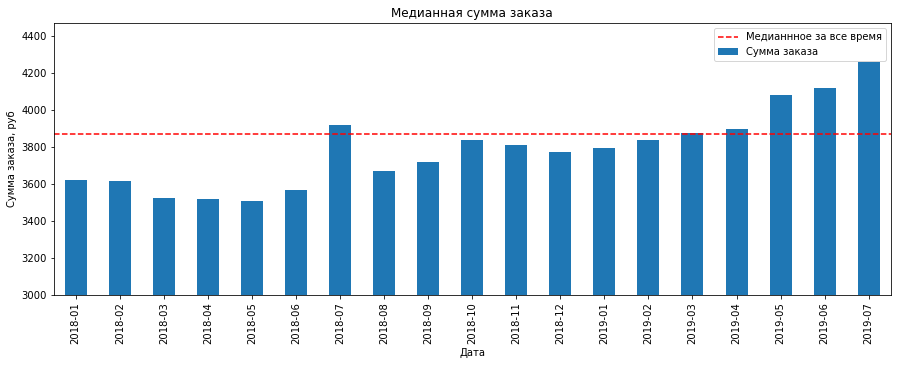

In [242]:
sales = orders.groupby('month_year')['item_total'].median()
sales.plot.bar(figsize = (15,5), ylim = 3000, label = 'Сумма заказа')
plt.title('Медианная сумма заказа')
plt.axhline(orders.item_total.median(), c = 'r', linestyle = '--', label = 'Медианнное за все время')
plt.xlabel('Дата')
plt.ylabel('Сумма заказа, руб')
plt.legend();

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

Виден рост количества заказов и выручки, при этом в 2019 году темп роста выручки опережает рост заказов.  
Медианный чек тоже растет, возможно в результате роста доли постоянных клиентов в заказах.  
Уровень доверия постоянных клиентов выше, что отражается на сумме заказа.  
Проверим это на данных


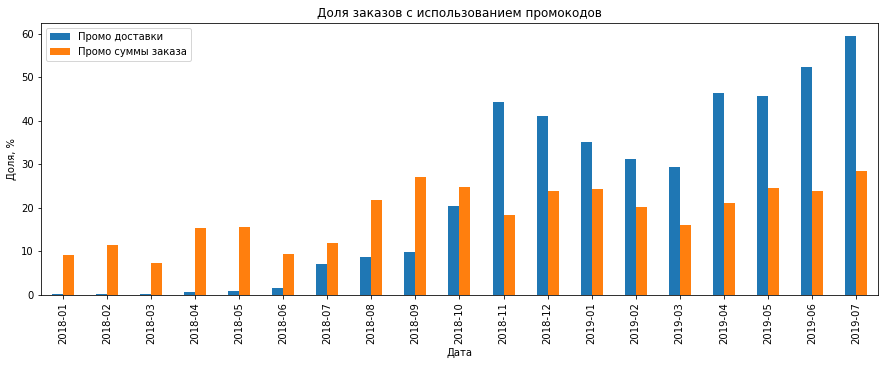

In [239]:
# Посмотрим обеспечен ли рост заказов раздачей промокодов

promo_cost = orders.pivot_table(index='month_year', values = 'id', aggfunc = 'nunique', columns = 'promo_cost')
promo_cost['share'] = round(promo_cost[1] / (promo_cost[0] + promo_cost[1]) * 100, 1)

promo_del = orders.pivot_table(index='month_year', values = 'id', aggfunc = 'nunique', columns = 'promo_del')
promo_del['share'] = round(promo_del[1] / (promo_del[0] + promo_del[1]) * 100, 1)

promo_del.merge(promo_cost, how = 'left', 
                left_index = True, right_index = True)[['share_x', 'share_y']].plot.bar(figsize = (15,5))
plt.title('Доля заказов с использованием промокодов')
plt.ylabel('Доля, %')
plt.xlabel('Дата')
plt.legend(['Промо доставки', 'Промо суммы заказа'])

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

В середине 2018 компания начала активно предоставлять скидку на стоимость доставки, с целью привлечения новых пользователей и повышения лояльности

In [274]:
# Посчитаем по месяцам медианный чек для постоянных и новых пользователей

old_users = list(orders[orders['month_year'] == '2018-01'].user_id.unique())
dates = list(orders.month_year.unique())
dates = dates[1:]
aging = {}
for i in dates:
    count_old = orders[(orders['month_year'] == i) & (orders['user_id'].isin(old_users))].user_id.count()
    median_old = orders[(orders['month_year'] == i) & (orders['user_id'].isin(old_users))].item_total.median()
    count_new = orders[(orders['month_year'] == i) & ~(orders['user_id'].isin(old_users))].user_id.count()
    median_new = orders[(orders['month_year'] == i) & ~(orders['user_id'].isin(old_users))].item_total.median()
    share_new = round(count_new / (count_new + count_old) * 100, 1)
    aging[i] = {'share_new' : share_new, 'median_new' : median_new, 'median_old' : median_old}
    old_users = old_users + list(orders[(orders['month_year'] == i) & ~(orders['user_id'].isin(old_users))].user_id.unique())
    

Text(0, 0.5, 'Доля, %')

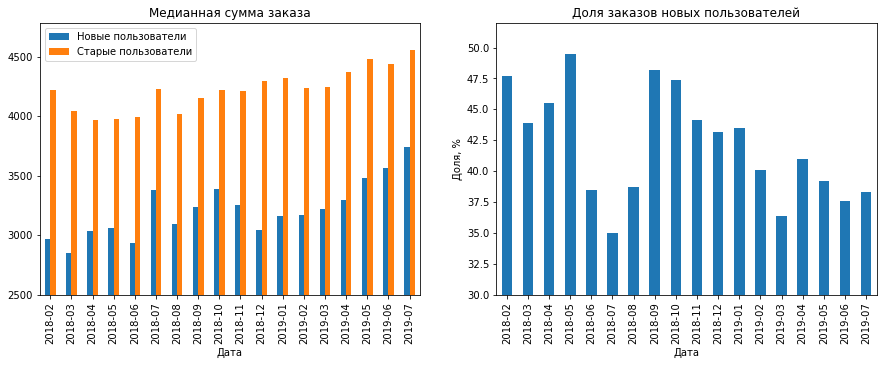

In [283]:
# вывод на график

median_diff = pd.DataFrame(aging).T

fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
median_diff[['median_new', 'median_old']].plot.bar(ax = axes[0], ylim = 2500)
axes[0].set_title('Медианная сумма заказа')
axes[0].set_xlabel('Дата')
axes[1].set_ylabel('Руб')
axes[0].legend(['Новые пользователи', 'Старые пользователи'])
median_diff['share_new'].plot.bar(ax = axes[1], ylim = 30)
axes[1].set_xlabel('Дата')
axes[1].set_title('Доля заказов новых пользователей')
axes[1].set_ylabel('Доля, %')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

Доля постоянных клиентов стабильно растет, а вместе с ней средний чек.  
В 2019 медианный чек рос и среди новых клиентов. Это может быть связано с ростом узнаваемости компании.  
Точный ответ на этот вопрос потребует дополнительного анализа.

## Удержание пользователей
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  


In [284]:
# Дата первичной регистрации отсутствовала, поэтому ретеншн стоит воспринимать как приближение
# Добавим в датафрейм месяц первого заказа для каждого пользователя

users = orders.groupby('user_id')['month_year'].min().reset_index()
orders = orders.merge(users[['user_id', 'month_year']], how = 'left', left_on = 'user_id', right_on = 'user_id')
orders.head(1)

,id_x,user_id,total_cost,cost,item_total,promo_total,total_weight,total_quantity,state,shipped_at,...,ends_at,time_zone,promo_cost,promo_del,promo,ship_weekday,ship_date,order_hour,del_hour,month_year_y
0,3158715,61138,290.0,290.0,2543,0.0,89906,35,shipped,2018-01-05 10:50:00,...,2018-01-05 10:00:00,Europe/Moscow,0,0,0,4.0,2018-01-05,0,8.0,2018-01


Text(114.0, 0.5, 'Месяц первой покупки')

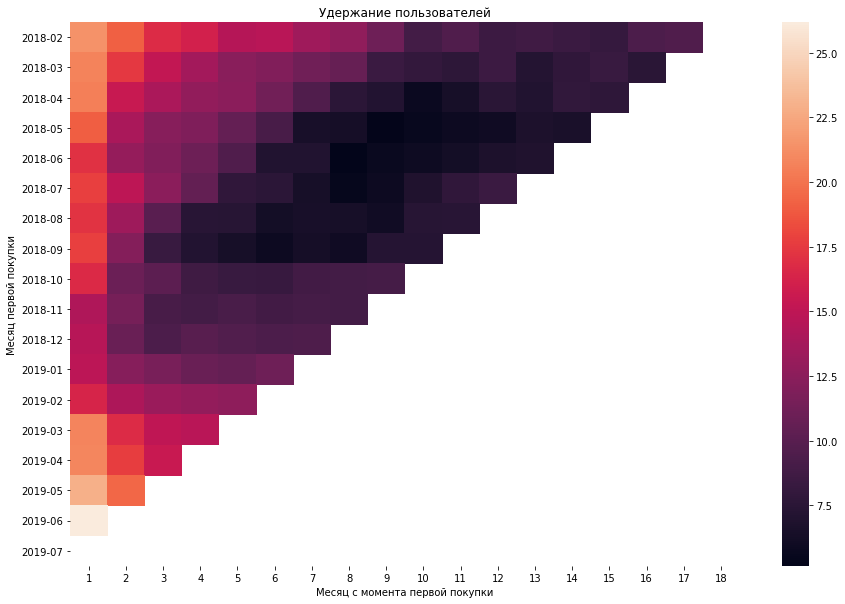

In [306]:
user_piv = orders.pivot_table(index = 'month_year_y', values = 'user_id', aggfunc = 'nunique', columns = 'month_year_x')
for i in range(len(user_piv)):
    user_piv.iloc[i, :] = user_piv.iloc[i, :] / user_piv.iloc[i, i] * 100

for i in range(1, len(user_piv)):
    user_piv.iloc[i, :] = user_piv.iloc[i, :].shift(-i, axis = 0)

user_piv.columns = range(len(user_piv))
plt.figure(figsize=(15,10))
sns.heatmap(user_piv.iloc[1:, 1:])
plt.title('Удержание пользователей')
plt.xlabel('Месяц с момента первой покупки')
plt.ylabel('Месяц первой покупки')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Наибольший отток пользователей наблюдается в первый месяц, уходит до 75% пользователей.  <br>
Затемненная область показывает, что сервис испытывал трудности с удержанием пользователей в конце 18 - начале 19 года.  <br>

### Распределение по городам и ретейлерам  
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

In [308]:
piv_ret = orders.pivot_table(index='retailer_id', values = 'item_total', aggfunc = ['sum', 'count'], columns = 'city')
sales = round(piv_ret.iloc[:, :8]/1000000, 1)
sales

sum                                   
city          1.0  2.0  5.0  8.0  10.0 13.0 20.0 23.0
retailer_id                                          
1.0         1410.8 64.3 28.5 17.7 32.0 13.6 10.9  9.1
8.0            4.5  0.2  nan  nan  nan  nan  nan  nan
15.0          22.6  2.8  nan  nan  nan  nan  nan  nan
16.0           0.6  nan  nan  nan  nan  nan  nan  nan

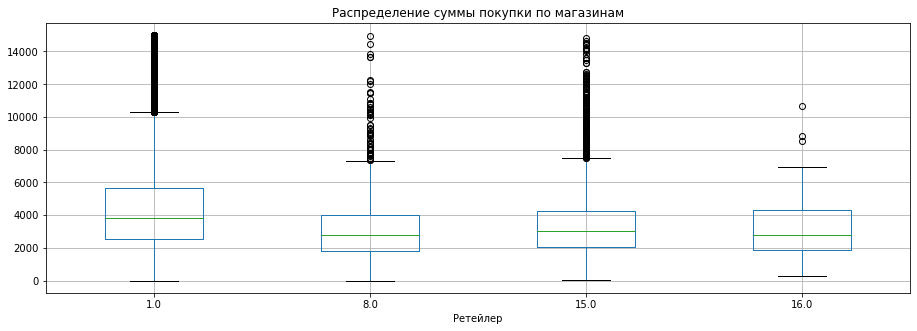

In [314]:
orders[orders['item_total'] < 15000].boxplot('item_total', by = 'retailer_id', figsize = (15,5))
plt.suptitle('')
plt.title('Распределение суммы покупки по магазинам')
plt.xlabel('Ретейлер');

In [323]:
cities = list(orders.city.unique())
cities.pop(1)
cities

[1.0, 2.0, 5.0, 20.0, 8.0, 23.0, 10.0, 13.0]

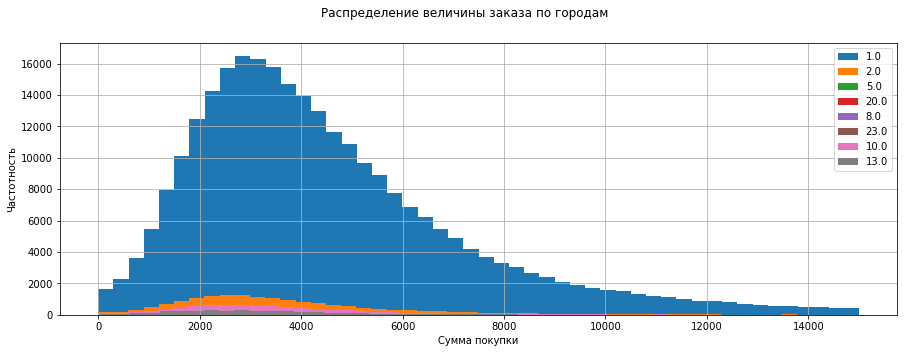

In [324]:
for i in cities:
    orders[(orders['city'] == i) & (orders['item_total'] < 15000)]['item_total'].hist(bins = 50, figsize=(15,5))
plt.suptitle('Распределение величины заказа по городам')
plt.xlabel('Сумма покупки')
plt.ylabel('Частотность')
plt.legend(cities)


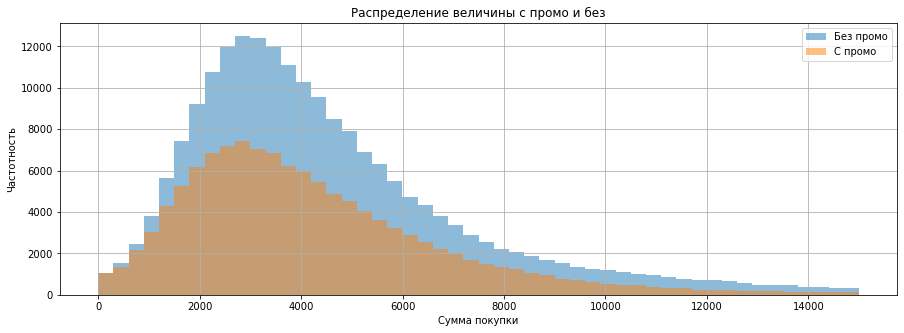

In [328]:
orders[(orders['promo'] == 0) & (orders['item_total'] < 15000)]['item_total'].hist(bins = 50, figsize=(15,5), alpha = .5)
orders[(orders['promo'] == 1) & (orders['item_total'] < 15000)]['item_total'].hist(bins = 50, figsize=(15,5), alpha = .5)
plt.legend(['Без промо', 'С промо'])
plt.title('Распределение величины с промо и без')
plt.xlabel('Сумма покупки')
plt.ylabel('Частотность');

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>
Сервис фокусируется на ретейлере 1 и городе 1.<br>
Ретейлер 1 и город 1 лидируют не только по количеству заказов, но и по средней сумме заказа. <br>
При такой структуре продаж погружения в региональный разрез не будет.

## Величина заказа в кг  
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

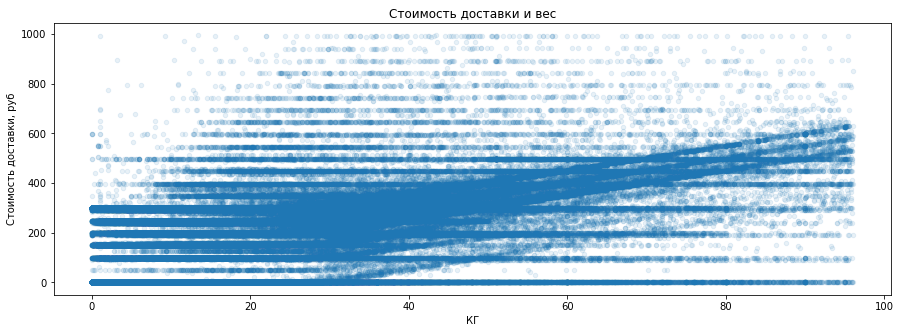

In [348]:
orders['kg'] = orders['total_weight'] / 1000
orders[(orders['kg'] < 96) & (orders['cost'] < 1000)].plot(kind = 'scatter', 
                                                           x = 'kg', 
                                                           y = 'cost', 
                                                           figsize = (15, 5), alpha = .1)
plt.title('Стоимость доставки и вес')
plt.xlabel('КГ')
plt.ylabel('Стоимость доставки, руб');   


<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Для заказов свыше 40кг стоимость доставки растет, но остается потенциал для оптимизации тарифов доставки крупных заказов.

## День и время заказа
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

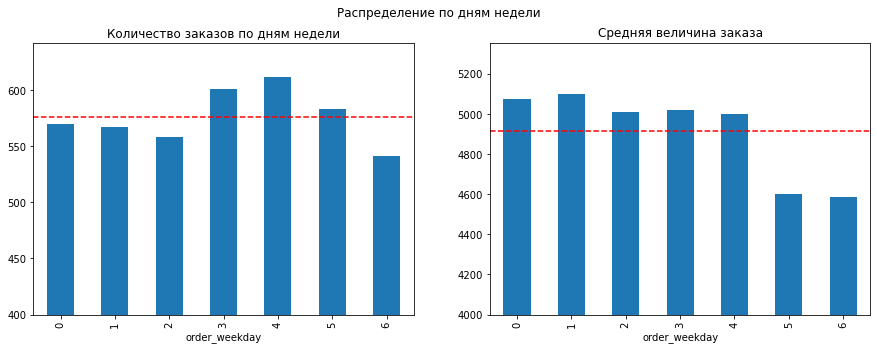

In [375]:
fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
data = orders.pivot_table(index = 'order_weekday',
                          values = ['id_x', 'order_date'],
                          aggfunc = {'id_x' : 'count', 'order_date' : 'nunique'})

data['average'] = data['id_x'] / data['order_date']
data['average'].plot.bar(ax = axes[0], ylim = 400)
axes[0].axhline(orders.id_x.count() / orders.order_date.nunique(), c = 'r', linestyle = '--')
axes[0].set_title('Количество заказов по дням недели')
orders.groupby('order_weekday')['item_total'].mean().plot.bar(ax = axes[1], ylim = 4000)
axes[1].axhline(orders.item_total.mean(), c = 'r', linestyle = '--')
axes[1].set_title('Средняя величина заказа')
plt.suptitle('Распределение по дням недели')
plt.show()

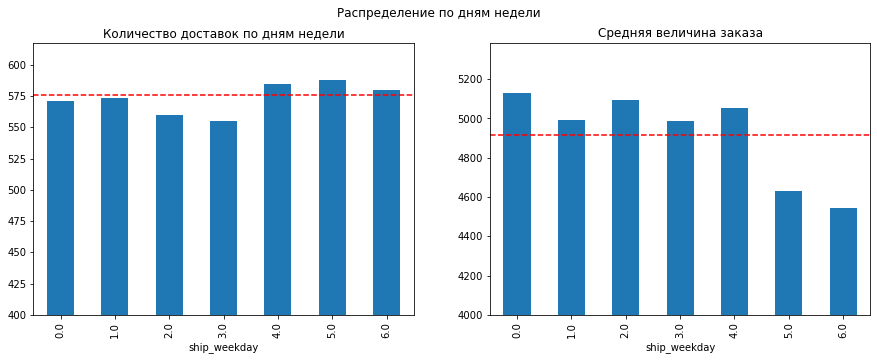

In [378]:
fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
data = orders.pivot_table(index = 'ship_weekday',
                          values = ['id_x', 'ship_date'],
                          aggfunc = {'id_x' : 'count', 'ship_date' : 'nunique'})

data['average'] = data['id_x'] / data['ship_date']
data['average'].plot.bar(ax = axes[0], ylim = 400)
axes[0].axhline(orders.id_x.count() / orders.order_date.nunique(), c = 'r', linestyle = '--')
axes[0].set_title('Количество доставок по дням недели')
orders.groupby('ship_weekday')['item_total'].mean().plot.bar(ax = axes[1], ylim = 4000)
axes[1].axhline(orders.item_total.mean(), c = 'r', linestyle = '--')
axes[1].set_title('Средняя величина заказа')
plt.suptitle('Распределение по дням недели')
plt.show()

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Наибольшее количество заказов поступает с четверга по субботу. <br>  
На выходных самый низкий средний чек. В понедельник же наоборот поступают самые крупные заказы.  <br> 

In [381]:
orders['same_day'] = orders.apply(lambda x: 1 if x.ship_date == x.order_date else 0, axis = 1)

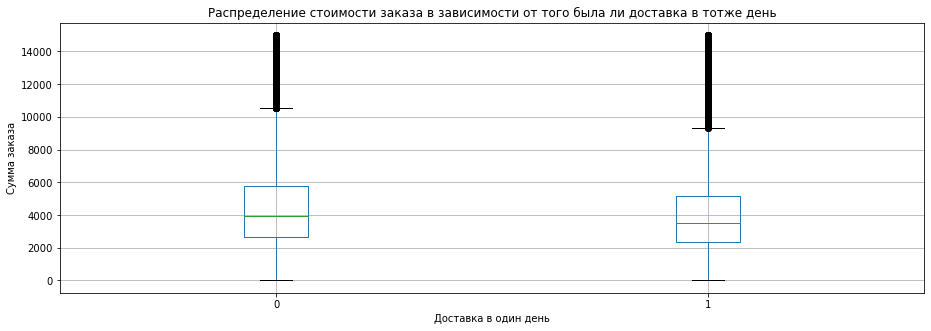

In [408]:
orders[(orders['item_total'] < 15000)].boxplot('item_total', by = 'same_day', figsize = (15,5))
plt.xlabel('Доставка в один день')
plt.ylabel('Сумма заказа')
plt.title('Распределение стоимости заказа в зависимости от того была ли доставка в тотже день')
plt.suptitle('')
plt.show()

Text(0, 0.5, 'День недели')

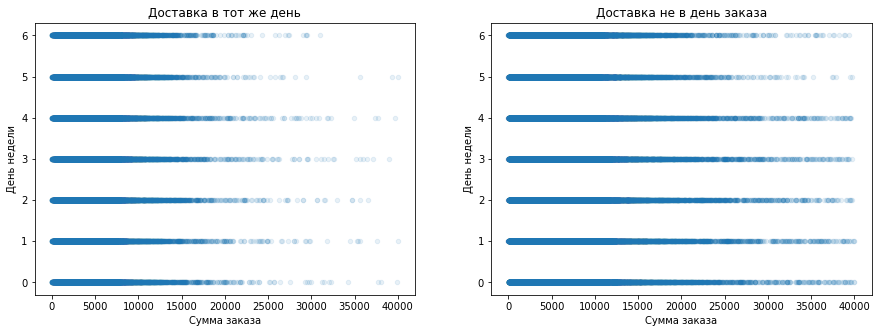

In [413]:
fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
orders[(orders['item_total'] < 40000) & (orders['same_day'] == 1)].plot.scatter(x = 'item_total', 
                                                                                y = 'order_weekday', 
                                                                                alpha = .1, ax = axes[0])
orders[(orders['item_total'] < 40000) & (orders['same_day'] == 0)].plot.scatter(x = 'item_total', 
                                                                                y = 'order_weekday', 
                                                                                alpha = .1, ax = axes[1])
axes[0].set_title('Доставка в тот же день')
axes[1].set_title('Доставка не в день заказа')
axes[0].set_xlabel('Сумма заказа')
axes[1].set_xlabel('Сумма заказа')
axes[0].set_ylabel('День недели')
axes[1].set_ylabel('День недели')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Средний чек заказов с доставкой в тот же день значительно ниже. <br>  
Пользователи, делающие крупные заказы, чаще оформляют заказ с отложенной доставкой<br> 
Заказы с низким средним чеком вероятнее всего имеют высокую срочность, пользователь сделал заказ чтобы закрыть срочную потребность.

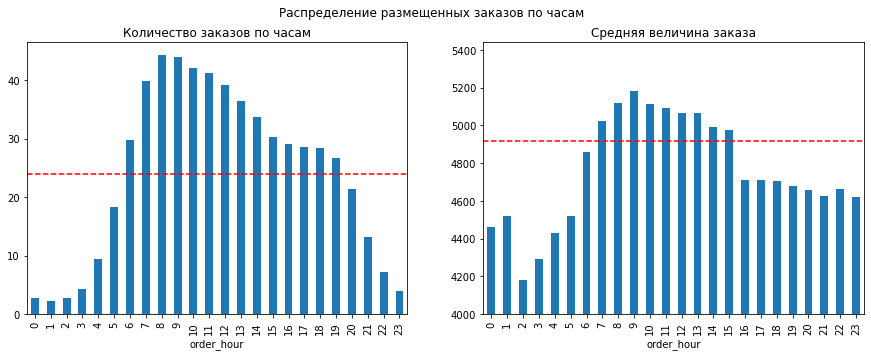

In [514]:
fёig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
data = orders.pivot_table(index = 'order_hour',
                          values = ['id_x', 'order_date'],
                          aggfunc = {'id_x' : 'count', 'order_date' : 'nunique'})

data['average'] = data['id_x'] / data['order_date']
data['average'].plot.bar(ax = axes[0])
axes[0].axhline(orders.id_x.count() / orders.order_date.nunique() / 24, c = 'r', linestyle = '--')
axes[0].set_title('Количество заказов по часам')
orders.groupby('order_hour')['item_total'].mean().plot.bar( ax = axes[1], ylim = 4000)
axes[1].axhline(orders.item_total.mean(), c = 'r', linestyle = '--')
axes[1].set_title('Средняя величина заказа')
plt.suptitle('Распределение размещенных заказов по часам')
plt.show()

In [361]:
orders['delivery_hour'] = orders['starts_at'].dt.hour

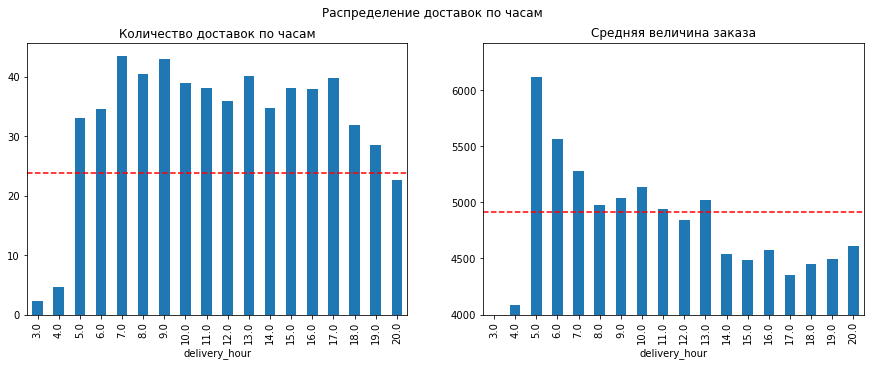

In [515]:
fig, axes = plt.subplots(1,2, figsize=(15,5), sharex=True)
data = orders.pivot_table(index = 'delivery_hour',
                          values = ['id_x', 'ship_date'],
                          aggfunc = {'id_x' : 'count', 'ship_date' : 'nunique'})

data['average'] = data['id_x'] / data['ship_date']
data['average'].plot.bar(ax = axes[0])
axes[0].axhline(orders.id_x.count() / orders.ship_date.nunique() / 24, c = 'r', linestyle = '--')
axes[0].set_title('Количество доставок по часам')
orders.groupby('delivery_hour')['item_total'].mean().plot.bar( ax = axes[1], ylim = 4000)
axes[1].axhline(orders.item_total.mean(), c = 'r', linestyle = '--')
axes[1].set_title('Средняя величина заказа')
plt.suptitle('Распределение доставок по часам')
plt.show()

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Чаще всего пользователи оформляют заказы в рабочее время. <br>  
Наиболее крупные заказы поступают с 8 до 16 часов.  <br> 
Большинство заказов доставляются первую половину дня.<br> 

## Соблюдение сроков доставки
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  

In [415]:
orders['intime'] = orders.apply(lambda x: 1 if x.shipped_at < x.ends_at else 0, axis = 1)

In [419]:
# Доля доставок вовремя
round(orders.intime.sum() / orders.id_x.count() * 100, 1)

84.1

Text(0.5, 1.0, 'Доля доставок вовремя по дням недели')

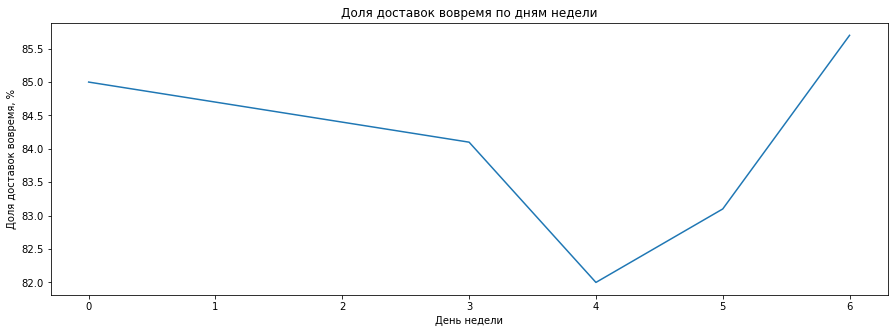

In [516]:
intime = orders.pivot_table(index = 'ship_weekday', values = ['id_x', 'intime'], aggfunc = {'id_x' : 'count', 'intime' : 'sum'})
intime['share'] = round(intime['intime'] / intime['id_x'] * 100, 1)
intime['share'].plot(figsize = (15,5))
plt.xlabel('День недели')
plt.ylabel('Доля доставок вовремя, %')
plt.title('Доля доставок вовремя по дням недели')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Доля заказов с нарушением сроков доставки относительно стабильна в течение недели - минимум достигается в пятницу, максимум в воскресенье.  


<ipython-input-424-cd6552baa6dd>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  late['min'] = late['shipped_at'] - late['ends_at']
<ipython-input-424-cd6552baa6dd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  late['min'] = late['min'].dt.total_seconds() / 60
<ipython-input-424-cd6552baa6dd>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.or

Text(0.5, 1.0, 'Медианная задержка в зависимости от часа')

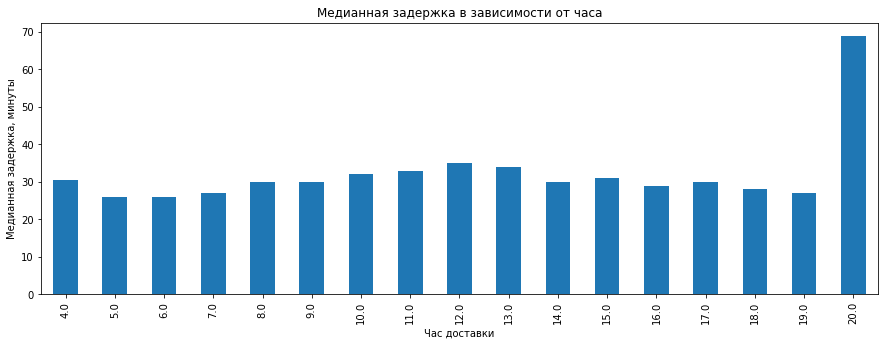

In [424]:
late = orders[orders['intime'] == 0]
late['min'] = late['shipped_at'] - late['ends_at']
late['min'] = late['min'].dt.total_seconds() / 60
late['min'] = round(late['min'], 0)
late.groupby('delivery_hour')['min'].median().iloc[1:].plot.bar(figsize=(15,5))
plt.xlabel('Час доставки')
plt.ylabel('Медианная задержка, минуты')
plt.title('Медианная задержка в зависимости от часа')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>  
Средняя задержка доставки составляет 30 минут. Максимальное время опаздания приходится на слот от 8 вечера.  
С учетом того что средний чек вечером обычно ниже, степень недовольства клиента должна быть особенно сильна.  
Это отражается на лояльности к сервису, особенно среди новых пользователей, которые чаще размещают заказы на меньшие суммы.
Стоит разработать инструменты мотивации пользователя к выбору наименее загруженного слота доставки.

Text(0.5, 1.0, 'Доля доставок вовремя по ретейлерам')

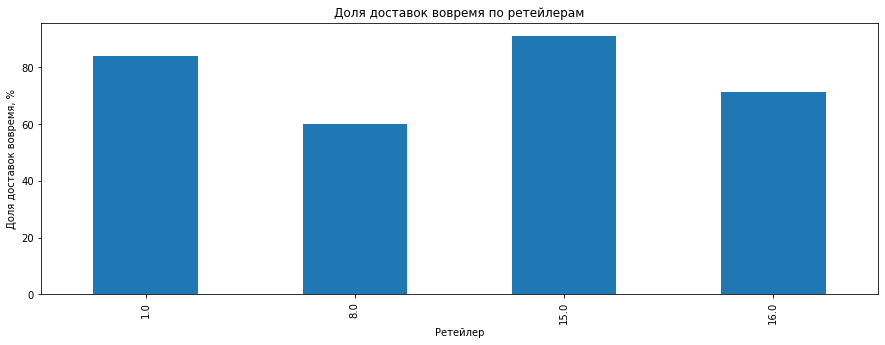

In [523]:
ret_del = orders.pivot_table(index = 'retailer_id', values = ['id_x', 'intime'], aggfunc = {'id_x' : 'count', 'intime' : 'sum'})
ret_del['share'] = round(ret_del['intime'] / ret_del['id_x'] * 100, 1)
ret_del.share.plot.bar(figsize=(15,5))
plt.xlabel('Ретейлер')
plt.ylabel('Доля доставок вовремя, %')
plt.title('Доля доставок вовремя по ретейлерам')

Text(0.5, 1.0, 'Доля доставок вовремя по городам')

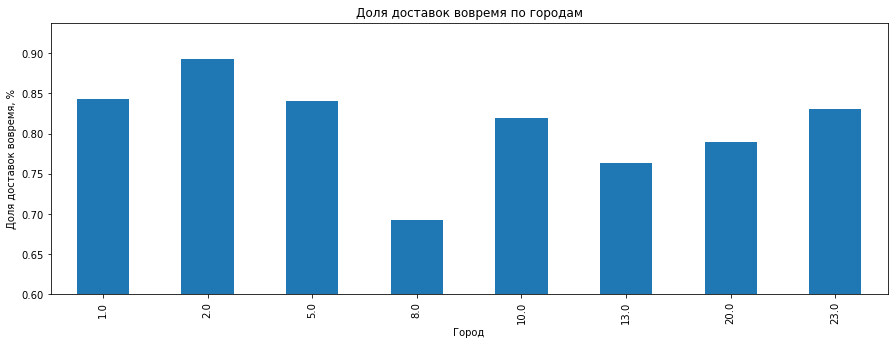

In [518]:
ret_del_c = orders.pivot_table(index = 'city', values = ['id_x', 'intime'], aggfunc = {'id_x' : 'count', 'intime' : 'sum'})
ret_del_c['share'] = ret_del_c['intime'] / ret_del_c['id_x']
ret_del_c.share.plot.bar(ylim=0.6, figsize=(15,5))
plt.xlabel('Город')
plt.ylabel('Доля доставок вовремя, %')
plt.title('Доля доставок вовремя по городам')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 
Наибольшая доля задержек доставки у ретейлера 8. При низкой доле заказов, приходяшейся на эту сеть и низком среднем чеке, сотрудничество с поставщиком, допускающим такую высокую долю опозданий, может в итоге негативно сказаться на сервисе

# Анализ в разрезе районов Москвы
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 

In [440]:
# Самымы крупным регионом для сервиса является Москва, стоит проанализировать данные по районам
# Загружаем json с координатами районов Москвы

counties = json.load(open(r'mo.geojson', 'r', encoding = 'utf-8'))

In [441]:
# Пишем функцию для определения в каком районе находятся заданные координаты
def coord_check(row):
    point = Feature(geometry=Point((row.lon, row.lat)))
    area = 'none'
    for i in range(len(counties['features'])):
        polygon = MultiPolygon([counties['features'][i]['geometry']['coordinates']])
        if boolean_point_in_polygon(point, polygon):
            area = counties['features'][i]['properties']['NAME']
            break
    return area

In [486]:
# Отрежем заказы приходящиеся не на Москву
or_map = orders[orders['city'] == 1]
or_map.columns

Index(['id_x', 'user_id', 'total_cost', 'cost', 'item_total', 'promo_total',
       'total_weight', 'total_quantity', 'state', 'shipped_at', 'created_at',
       'ship_address_id', 'store_id_x', 'delivery_window_id', 'month_year_x',
       'canc', 'repl', 'order_weekday', 'order_date', 'id_y', 'city',
       'retailer_id', 'store_id_z', 'id', 'starts_at', 'ends_at', 'time_zone',
       'promo_cost', 'promo_del', 'promo', 'ship_weekday', 'ship_date',
       'order_hour', 'del_hour', 'month_year_y', 'kg', 'delivery_hour',
       'same_day', 'intime'],
      dtype='object')

In [434]:
# Объединим датасет с координатами заказов
query = '''
        SELECT * FROM addresses     
'''

In [435]:
address = pd.io.sql.read_sql(query, con = engine)
address = address.iloc[:, :3]

In [488]:
or_map = or_map.merge(address, how = 'left', left_on = 'ship_address_id', right_on = 'id', suffixes = ('_o', '_a'))

In [489]:
or_map.columns

Index(['id_x', 'user_id', 'total_cost', 'cost', 'item_total', 'promo_total',
       'total_weight', 'total_quantity', 'state', 'shipped_at', 'created_at',
       'ship_address_id', 'store_id_x', 'delivery_window_id', 'month_year_x',
       'canc', 'repl', 'order_weekday', 'order_date', 'id_y', 'city',
       'retailer_id', 'store_id_z', 'id_o', 'starts_at', 'ends_at',
       'time_zone', 'promo_cost', 'promo_del', 'promo', 'ship_weekday',
       'ship_date', 'order_hour', 'del_hour', 'month_year_y', 'kg',
       'delivery_hour', 'same_day', 'intime', 'lat', 'lon', 'id_a'],
      dtype='object')

In [490]:
# Выполнение функции для всего датафрейма занимает много времени, поэтому я применю ее на ограниченных данных
# Возьмем все пятницы июля
friday = or_map[(or_map['month_year_x'] == '07-2019') & (or_map['ship_weekday'] == 4)]

In [491]:
len(friday)

4204

In [492]:
friday['area'] = friday.apply(coord_check, axis = 1)

<ipython-input-492-01a7c22bfd9b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [494]:
# Делаем группировку по районам
piv = friday.pivot_table(index = 'area', values = 'id_x', aggfunc = 'count').reset_index()
piv = piv.iloc[1:, :]
piv

,area,id_x
1,Академический,46
2,Алексеевский,45
3,Алтуфьевский,3
4,Арбат,33
5,Аэропорт,51
...,...,...
108,Южное Тушино,35
109,Южнопортовый,32
110,Якиманка,20
111,Ярославский,22


In [526]:
# Рисуем карту
fig = px.choropleth(piv, locations = 'area', geojson = counties, 
                    color = 'id_x', scope = 'europe', featureidkey = 'properties.NAME', hover_name = 'area', 
                    labels={'id_x':'Количество заказов'})
fig.update_geos(fitbounds = 'locations')
fig.update_layout(margin = dict(l = 0,
                                r = 0,
                                t = 30,
                                b = 0
                               ),
                 title={
                     'text': "Количество доставок по районам Москвы",
                     'y':1.0,
                     'x':0.4,
                     'xanchor': 'center',
                     'yanchor': 'top'
                 },
                 )
fig.show()

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 
ЦАО, ЗАО, ЮЗАО - округа с наибольшим количеством заказов в Москве. Меньше всего заказов приходится на СВАО и ЮВАО

In [496]:
fri_del = friday.pivot_table(index='area', columns = 'intime', values = 'id_x', aggfunc = 'count').iloc[1:, :]
fri_del['total'] = fri_del[0] + fri_del[1]
fri_del['share'] = round(fri_del[0] / fri_del['total'] * 100, 1)
fri_del = fri_del.reset_index()

In [543]:
fig = px.choropleth(fri_del, locations = 'area', geojson = counties, 
                    color = 'share', scope = 'europe', featureidkey = 'properties.NAME', hover_name = 'area', 
                    labels={'share':'Доля опозданий, %'})
fig.update_geos(fitbounds = 'locations')
fig.update_layout(margin = dict(l = 0,
                                r = 0,
                                t = 30,
                                b = 0
                               ),
                 title={
                     'text': "Доля опозданий по районам Москвы",
                     'y':1.0,
                     'x':0.43,
                     'xanchor': 'center',
                     'yanchor': 'top'
                 },
                 )
fig.show()

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 
Наиболее остро ситуация с нарушением сроков доставки стоит на севере и северо-востоке Москвы.<br> 
Возможно это прична низкого количество заказов, поступающих из этих районов.

In [498]:
tot_sum = friday.pivot_table(index='area', values = 'item_total', aggfunc = 'sum').iloc[1:, :]
tot_sum = tot_sum.reset_index()

In [524]:
fig = px.choropleth(tot_sum, locations = 'area', geojson = counties, 
                    color = 'item_total', scope = 'europe', featureidkey = 'properties.NAME', hover_name = 'area', 
                    labels={'item_total':'Сумма заказов'})
fig.update_geos(fitbounds = 'locations')
fig.update_layout(margin = dict(l = 0,
                                r = 0,
                                t = 30,
                                b = 0
                               ),
                 title={
                     'text': "Выручка по районам Москвы",
                     'y':1.0,
                     'x':0.43,
                     'xanchor': 'center',
                     'yanchor': 'top'
                 },
                 )
fig.show()

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 
Центр Москвы лидирует не только по количеству доставок, но и по суммарной выручке.

## Замена товарных позиций  
<hr style="background-color: rgb(0,0,0);height: 3.0px;"/> 

In [506]:
retur = orders.pivot_table(index = 'store_id_x', 
                           values = ['user_id', 'canc', 'repl'], 
                           aggfunc = {'user_id' : 'count', 
                                      'canc' : 'sum', 
                                      'repl' : 'sum'})

In [507]:
retur['sh_canc'] = retur['canc'] / retur['user_id'] * 100
retur['sh_repl'] = retur['repl'] / retur['user_id'] * 100

Text(0.5, 1.0, 'Магазины лидеры по заменам')

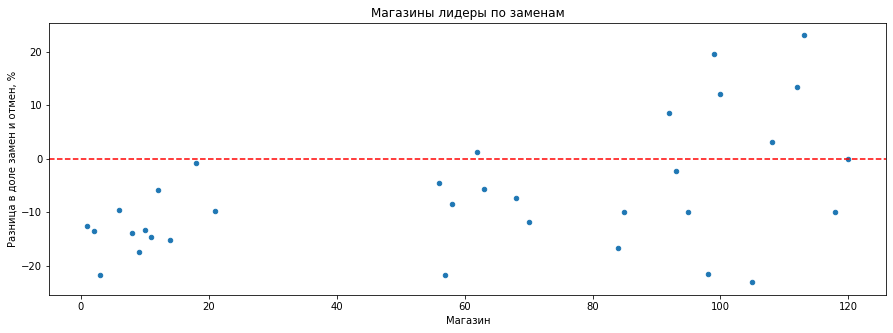

In [509]:
# Рисуем график с разницей доли  заказов с отменами товаров и заказов в которых товар был заменен
retur['diff'] = retur['sh_repl'] - retur['sh_canc']
retur.reset_index().plot.scatter('store_id_x', 'diff', figsize=(15,5))
plt.axhline(0, c='red', linestyle = 'dashed')
plt.xlabel('Магазин')
plt.ylabel('Разница в доле замен и отмен, %')
plt.title('Магазины лидеры по заменам')

<hr style="background-color: rgb(0,0,0);height: 3.0px;"/>   
Отмена позиций из уже сформированного заказа негативно влияет на пользовательский опыт.  <br>
В таких случаях на первый план выходит способность сотрудников предложить достойную альтернативу. <br>
Среди розничных магазинов есть те, в которых доля замен выше доли отмененных позиций.  <br>
Необходимо исследовать причины высокой доли замен в этих магазинах и перенять лучшие практики сотрудников.